# Decision Tree on Amazon Fine Food Reviews Analysis


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (Rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use the Score/Rating. A rating of 4 or 5 could be cosnidered a positive review. A review of 1 or 2 could be considered negative. A review of 3 is nuetral and ignored. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




In [1]:
%matplotlib inline
import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD 
from scipy.sparse import csr_matrix

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

from sklearn.cross_validation import train_test_split
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.grid_search import RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report


from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import cross_validation
from sklearn import datasets, neighbors
from prettytable import PrettyTable
import warnings
from sklearn.exceptions import DataConversionWarning, UndefinedMetricWarning
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DataConversionWarning)
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

F:\Users\Admin\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
F:\Users\Admin\Anaconda3\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


#### Reading back the preprocessed data saved in final.sqlite

In [2]:

#Using sqlite3 to retrieve data from sqlite file

con = sqlite3.connect("final.sqlite")#Loading Cleaned/ Preprocesed text that we did in Text Preprocessing

#Using pandas functions to query from sql table
df = pd.read_sql_query("""
SELECT * FROM Reviews 
""",con)

#Reviews is the name of the table given
#Taking only the data where score != 3 as score 3 will be neutral and it won't help us much
df.head()

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText
0,138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...
1,138688,150506,0006641040,A2IW4PEEKO2R0U,Tracy,1,1,positive,1194739200,"Love the book, miss the hard cover version","I grew up reading these Sendak books, and watc...",grew read sendak book watch realli rosi movi i...
2,138689,150507,0006641040,A1S4A3IQ2MU7V4,"sally sue ""sally sue""",1,1,positive,1191456000,chicken soup with rice months,This is a fun way for children to learn their ...,fun way children learn month year learn poem t...
3,138690,150508,0006641040,AZGXZ2UUK6X,"Catherine Hallberg ""(Kate)""",1,1,positive,1076025600,a good swingy rhythm for reading aloud,This is a great little book to read aloud- it ...,great littl book read nice rhythm well good re...
4,138691,150509,0006641040,A3CMRKGE0P909G,Teresa,3,4,positive,1018396800,A great way to learn the months,This is a book of poetry about the months of t...,book poetri month year goe month cute littl po...


In [3]:
df_data=df.sort_values('Time', axis=0, ascending=False, inplace=False, kind='quicksort', na_position='last')

In [4]:
my_final = df_data.take(np.random.permutation(len(df))[:100000])
print(my_final.shape)

(100000, 12)


In [5]:
X = my_final['CleanedText']
y = my_final['Score']

In [6]:
# split the data set into crossvalidation train and test
X_train, X_test, y_train, y_test = cross_validation.train_test_split(X, y, test_size=0.3, random_state=0)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(70000,) (70000,) (30000,) (30000,)


# Bag of Words (BoW)

In [7]:
count_vec = CountVectorizer(max_features=2000)
X_trainbow = count_vec.fit_transform(X_train)
# Test Vectorizor
X_testbow = count_vec.transform(X_test)
print(X_trainbow.shape)
print(X_testbow.shape)

(70000, 2000)
(30000, 2000)


#### Hyperparameter tuning of decision tree using GridSearchCV

In [56]:
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score
Depths =[3,4,5,6,7,8,9,10,11,15,18,20,23,25,30,32,35,40,42,45,50] 
param_grid = {'max_depth': Depths}
scorer = make_scorer(f1_score, pos_label="positive")
estimator=tree.DecisionTreeClassifier(min_samples_leaf=20,max_features=20,min_samples_split=50,class_weight='balanced')
model = GridSearchCV(estimator,param_grid, scoring = scorer, cv=3,pre_dispatch=2)

In [57]:
model.fit(X_trainbow,y_train) 
print(model.best_estimator_)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=6,
            max_features=20, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


#### Validation Curve

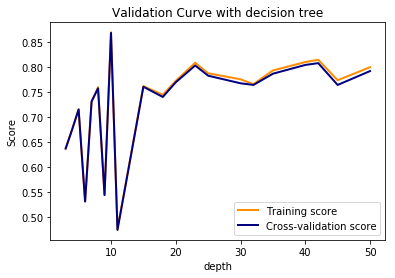

In [58]:
 
from sklearn.model_selection import validation_curve
train_scores, test_scores = validation_curve( estimator, X_trainbow, y_train, param_name="max_depth", 
                                             param_range=Depths,cv=3, scoring=scorer, n_jobs=1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with decision tree")
plt.xlabel("depth")
plt.ylabel("Score")
plt.plot(Depths, train_scores_mean, label="Training score",
             color="darkorange", lw=2)
plt.plot(Depths, test_scores_mean, label="Cross-validation score",
             color="navy", lw=2)
plt.legend(loc="best")
plt.show()

#### Accuracy Report

In [8]:
clf =tree.DecisionTreeClassifier(max_depth=6)

# fitting the model
clf.fit(X_trainbow,y_train)

# predict the response
pred_bow=clf.predict(X_testbow)
pred_train=clf.predict(X_trainbow)

acc_bow = accuracy_score(y_test, pred_bow) * 100
print('\nThe accuracy of the classifier is %f%%' %(acc_bow))
acc_train_bow = clf.score(X_trainbow,y_train)*100
print("accuracy on train data is {}%".format(acc_train_bow))
error_train_bow = (100-acc_train_bow)
print("error on train data is {}%".format(error_train_bow))
error_test_bow = (100-acc_bow)
print("error on test data is {}%".format(error_test_bow))
print("-------------------------------------------------")
print(classification_report(y_test, pred_bow))


The accuracy of the classifier is 86.200000%
accuracy on train data is 86.31%
error on train data is 13.689999999999998%
error on test data is 13.799999999999997%
-------------------------------------------------
             precision    recall  f1-score   support

   negative       0.72      0.20      0.32      4721
   positive       0.87      0.98      0.92     25279

avg / total       0.84      0.86      0.83     30000



#### Confusion Matrix

Text(0.5,24,'Predicted label')

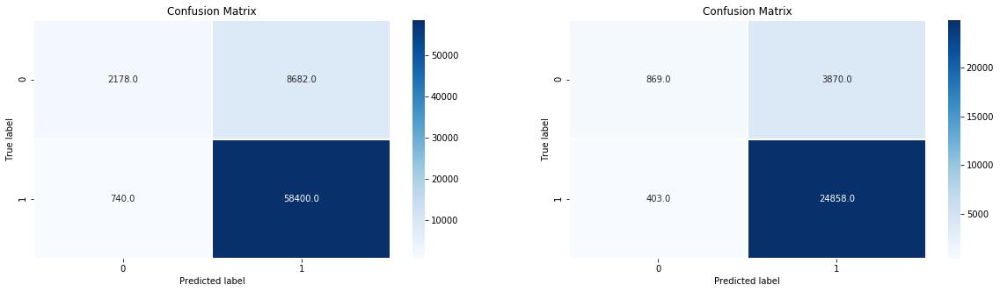

In [60]:
import seaborn as sns
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
cm = confusion_matrix(y_train,pred_train)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test,pred_bow)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

#### Visualization of Decision Tree

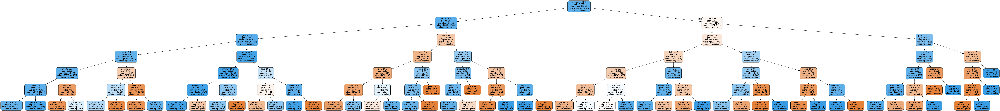

In [61]:
from IPython.display import Image 
from sklearn.tree import export_graphviz
#from graphviz import Source
import graphviz
import pydotplus
from sklearn.externals.six import StringIO  
target = ['negative','positive']
# Create DOT data
dot_data = StringIO()
data = tree.export_graphviz(clf,out_file=dot_data,feature_names=count_vec.get_feature_names(),class_names=target,
                             filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
# Show graph
Image(graph.create_png())

#### Feature Importance

            importance
feature               
disappoint       0.244
great            0.147
wast             0.136
return           0.108
love             0.099
worst            0.076
money            0.030
wont             0.019
aw               0.015
delici           0.012
terribl          0.010
best             0.010
refund           0.010
bad              0.008
year             0.008
excel            0.008
unfortun         0.005
favorit          0.004
enjoy            0.004
mayb             0.003
often            0.003
purchas          0.003
perfect          0.003
order            0.002
keep             0.002


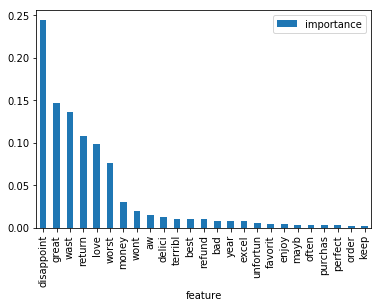

In [9]:
importances = pd.DataFrame({'feature':count_vec.get_feature_names(),'importance':np.round(clf.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
 
print(importances[:25])
importances[:25].plot.bar()

# TF-IDF

In [10]:
tfidf = TfidfVectorizer(max_features=2000) #Using bi-grams
X_traintfidf = tfidf.fit_transform(X_train)
print("Train Data Size: ",X_traintfidf.shape)
X_testtfidf = tfidf.transform(X_test)
print("Test Data Size: ",X_testtfidf.shape)

Train Data Size:  (70000, 2000)
Test Data Size:  (30000, 2000)


#### Decision Tree with GridSearchCV

In [43]:
Depths = [3,4,5,6,7,8,9,10,11,15,18,20,23,25,30,32,35,40,42,45,50]
param_grid = {'max_depth': Depths}
scorer = make_scorer(f1_score, pos_label="positive")
estimator=tree.DecisionTreeClassifier(min_samples_leaf=20,max_features=20,class_weight='balanced')
model = GridSearchCV(estimator,param_grid, scoring = scorer, cv=3,pre_dispatch=2)

In [44]:
model.fit(X_traintfidf,y_train)
print(model.best_estimator_)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=20, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


#### Validation Curve

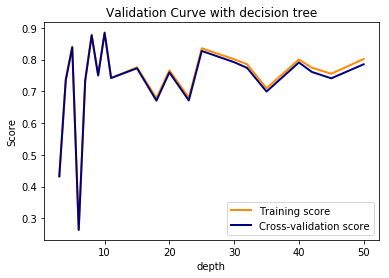

In [47]:
from sklearn.model_selection import validation_curve
train_scores, test_scores = validation_curve( estimator, X_traintfidf, y_train, param_name="max_depth", 
                                             param_range=Depths,cv=3, scoring=scorer, n_jobs=1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with decision tree")
plt.xlabel("depth")
plt.ylabel("Score")
plt.plot(Depths, train_scores_mean, label="Training score",
             color="darkorange", lw=2)
plt.plot(Depths, test_scores_mean, label="Cross-validation score",
             color="navy", lw=2)
plt.legend(loc="best")
plt.show()

#### Accuracy Report

In [11]:
clf =tree.DecisionTreeClassifier(max_depth=5)

# fitting the model
clf.fit(X_traintfidf, y_train)

# predict the response
pred_tfidf=clf.predict(X_testtfidf)
pred_train=clf.predict(X_traintfidf)

acc_tfidf = accuracy_score(y_test, pred_tfidf) * 100
print('\nThe accuracy of the classifier is %f%%' %(acc_tfidf))
acc_train_tfidf = clf.score(X_traintfidf,y_train)*100
print("accuracy on train data is {}%".format(acc_train_tfidf))
error_train_tfidf = (100-acc_train_tfidf)
print("error on train data is {}%".format(error_train_tfidf))
error_test_tfidf = (100-acc_tfidf)
print("error on test data is {}%".format(error_test_tfidf))
print("-------------------------------------------------")
print(classification_report(y_test, pred_tfidf))


The accuracy of the classifier is 85.616667%
accuracy on train data is 85.88714285714286%
error on train data is 14.112857142857138%
error on test data is 14.38333333333334%
-------------------------------------------------
             precision    recall  f1-score   support

   negative       0.65      0.18      0.28      4721
   positive       0.87      0.98      0.92     25279

avg / total       0.83      0.86      0.82     30000



#### Confusion Matrix

Text(0.5,24,'Predicted label')

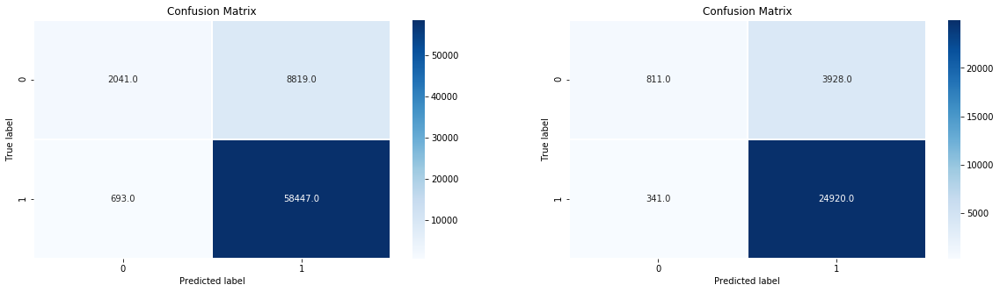

In [49]:
import seaborn as sns
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
cm = confusion_matrix(y_train,pred_train)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test,pred_tfidf)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

#### Visualization of Decision Tree

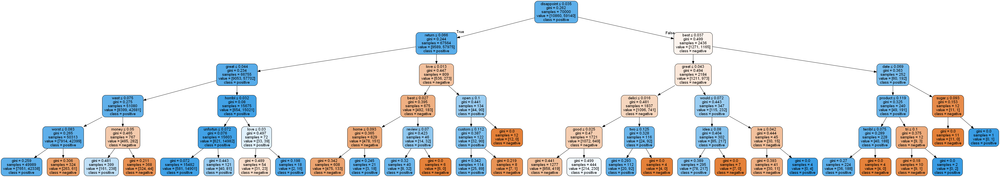

In [50]:
from IPython.display import Image 
from sklearn.tree import export_graphviz
#from graphviz import Source
import graphviz
import pydotplus
import io
target = ['negative','positive']
dot_data = StringIO()
data = tree.export_graphviz(clf,out_file=dot_data,feature_names=tfidf.get_feature_names(),class_names=target,
                             filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
# Show graph
Image(graph.create_png())

#### Feature Importance

            importance
feature               
disappoint       0.286
great            0.170
wast             0.166
return           0.135
love             0.117
money            0.032
wont             0.023
delici           0.014
terribl          0.010
excel            0.009
home             0.007
purchas          0.004
order            0.004
buy              0.003
best             0.003
favorit          0.003
aw               0.003
ever             0.002
good             0.002
expect           0.002
brown            0.001
way              0.001
ship             0.001
put              0.000
ran              0.000


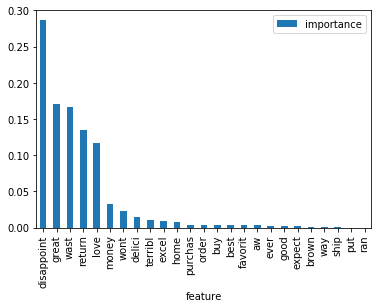

In [12]:
importances = pd.DataFrame({'feature':tfidf.get_feature_names(),'importance':np.round(clf.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
 
print(importances[:25])
importances[:25].plot.bar()


# Word TO Vec

In [7]:
import re

def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [8]:
# Train your own Word2Vec model using your own train corpus
import gensim
list_of_sent = []
for sent in X_train:
    filtered_sentence = []
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)

F:\Users\Admin\Anaconda3\lib\site-packages\gensim\utils.py:1212: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [9]:
# min_count = 5 considers only words that occured atleast 5 times

from gensim.models import Word2Vec
w2v_model=Word2Vec(list_of_sent,min_count=5,size=300, workers=4)
w2v_words = list(w2v_model.wv.vocab)

In [10]:
# List of sentence in X_est text
sent_of_test=[]
for sent in X_test:
    sent_of_test.append(sent.split()) 

# Avg W2V, TFIDF-W2V

In [11]:
from tqdm import tqdm
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sent): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))


100%|██████████████████████████████████| 70000/70000 [00:31<00:00, 2212.56it/s]


70000
300


In [12]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(sent_of_test): # for each review/sentence
    sent_vec = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)
print(len(sent_vectors_test))
print(len(sent_vectors_test[0]))


100%|██████████████████████████████████| 30000/30000 [00:13<00:00, 2185.32it/s]


30000
300


In [13]:
X_trainw2v = np.array(sent_vectors)
X_testw2v=np.array(sent_vectors_test)
X_trainw2v=np.nan_to_num(X_trainw2v)
X_testw2v=np.nan_to_num(X_testw2v)

#### Decision Tree using GridSearch CV 

In [66]:
param_grid = {'max_depth': Depths}
scorer = make_scorer(f1_score, pos_label="positive")
estimator=tree.DecisionTreeClassifier(min_samples_leaf=20,class_weight='balanced')
model = GridSearchCV(estimator,param_grid, scoring =scorer, cv=3,pre_dispatch=2)

In [68]:
model.fit(X_trainw2v,y_train)
print(model.best_estimator_)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=42, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


#### Validation Curve

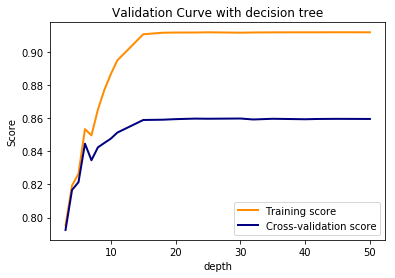

In [71]:
 
from sklearn.model_selection import validation_curve
train_scores, test_scores = validation_curve( estimator, X_trainw2v, y_train, param_name="max_depth", 
                                             param_range=Depths,cv=3, scoring=scorer, n_jobs=1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with decision tree")
plt.xlabel("depth")
plt.ylabel("Score")
plt.plot(Depths, train_scores_mean, label="Training score",
             color="darkorange", lw=2)
plt.plot(Depths, test_scores_mean, label="Cross-validation score",
             color="navy", lw=2)
plt.legend(loc="best")
plt.show()

#### Accuracy Report

In [69]:
clf =tree.DecisionTreeClassifier(max_depth=42)

# fitting the model
clf.fit(X_trainw2v,y_train)

# predict the response
pred_w2v=clf.predict(X_testw2v)
pred_train=clf.predict(X_trainw2v)

acc_w2v = accuracy_score(y_test, pred_w2v) * 100
print('\nThe accuracy of the classifier is %f%%' %(acc_w2v))
acc_train_w2v = clf.score(X_trainw2v,y_train)*100
print("accuracy on train data is {}%".format(acc_train_w2v))
error_train_w2v = (100-acc_train_w2v)
print("error on train data is {}%".format(error_train_w2v))
error_test_w2v = (100-acc_w2v)
print("error on test data is {}%".format(error_test_w2v))
print("-------------------------------------------------")
print(classification_report(y_test, pred_w2v))


The accuracy of the classifier is 82.050000%
accuracy on train data is 99.96857142857142%
error on train data is 0.031428571428577357%
error on test data is 17.950000000000003%
-------------------------------------------------
             precision    recall  f1-score   support

   negative       0.44      0.46      0.45      4739
   positive       0.90      0.89      0.89     25261

avg / total       0.82      0.82      0.82     30000



#### Confusion Matrix

Text(0.5,24,'Predicted label')

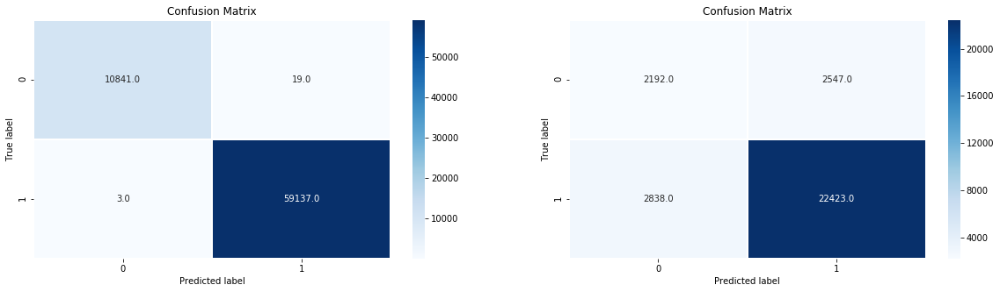

In [70]:
import seaborn as sns
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
cm = confusion_matrix(y_train,pred_train)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test,pred_w2v)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

#### Visualization of Decision Tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.162867 to fit



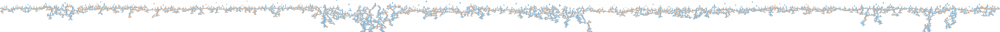

In [72]:
from IPython.display import Image 
from sklearn.tree import export_graphviz
#from graphviz import Source
import graphviz
import pydotplus
target = ['negative','positive']
# Create DOT data
data = tree.export_graphviz(clf,out_file=None,class_names=target,filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(data)


# Show graph
Image(graph.create_png())

## TF-IDF weighted Word2Vec

In [14]:
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(X_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [16]:
from tqdm import tqdm
# TF-IDF weighted Word2Vec
#dictionary = dict(zip(tfidf.get_feature_names(), list(tfidf.idf_)))
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(300) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            if word in w2v_words:
                vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*sent.count(word)
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        except:
            pass
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|███████████████████████████████████| 70000/70000 [03:31<00:00, 331.12it/s]


In [17]:
from tqdm import tqdm
# TF-IDF weighted Word2Vec
#dictionary = dict(zip(tfidf.get_feature_names(), list(tfidf.idf_)))
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_test = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(sent_of_test): # for each review/sentence 
    sent_vec = np.zeros(300) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            if word in w2v_words:
                vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*sent.count(word)
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        except:
            pass
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_test.append(sent_vec)
    row += 1

100%|███████████████████████████████████| 30000/30000 [01:35<00:00, 313.48it/s]


In [18]:

X_trainw2vtfidf=np.array(tfidf_sent_vectors)
X_testw2vtfidf=np.array(tfidf_sent_vectors_test)

In [19]:
X_trainw2vtfidf.shape


(70000, 300)

In [20]:
X_trainw2vtfidf=np.nan_to_num(X_trainw2vtfidf)

#### Decision Tree using RandomSearch CV 

In [80]:

param_grid = {'max_depth': Depths}
scorer = make_scorer(f1_score, pos_label="positive")
estimator=tree.DecisionTreeClassifier(min_samples_leaf=20,class_weight='balanced')
model = GridSearchCV(estimator,param_grid, scoring = scorer, cv=3,pre_dispatch=2)

In [82]:
model.fit(X_trainw2vtfidf,y_train)
print(model.best_estimator_)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=35, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=20, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


#### Validation Curve

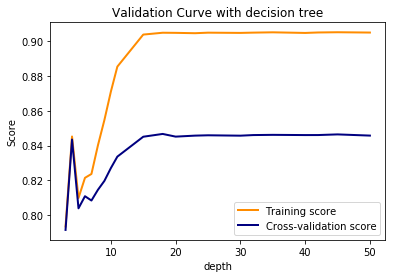

In [83]:
from sklearn.model_selection import validation_curve
train_scores, test_scores = validation_curve( estimator, X_trainw2vtfidf, y_train, param_name="max_depth", 
                                             param_range=Depths,cv=3, scoring=scorer, n_jobs=1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with decision tree")
plt.xlabel("depth")
plt.ylabel("Score")
plt.plot(Depths, train_scores_mean, label="Training score",
             color="darkorange", lw=2)
plt.plot(Depths, test_scores_mean, label="Cross-validation score",
             color="navy", lw=2)
plt.legend(loc="best")
plt.show()

#### Accuracy Report

In [43]:
clf =tree.DecisionTreeClassifier(max_depth=35)

# fitting the model
clf.fit(X_trainw2vtfidf, y_train)

# predict the response
pred_w2vtfidf=clf.predict(X_testw2vtfidf)
pred_train=clf.predict(X_trainw2vtfidf)

acc_w2vtfidf = accuracy_score(y_test, pred_w2vtfidf) * 100
print('\nThe accuracy of the classifier is %f%%' %(acc_w2vtfidf))
acc_train_w2vtfidf = clf.score(X_trainw2vtfidf,y_train)*100
print("accuracy on train data is {}%".format(acc_train_w2vtfidf))
error_train_w2vtfidf = (100-acc_train_w2vtfidf)
print("error on train data is {}%".format(error_train_w2vtfidf))
error_test_w2vtfidf = (100-acc_w2vtfidf)
print("error on test data is {}%".format(error_test_w2vtfidf))
print("-------------------------------------------------")
print(classification_report(y_test, pred_w2vtfidf))


The accuracy of the classifier is 80.333333%
accuracy on train data is 99.99285714285713%
error on train data is 0.0071428571428668874%
error on test data is 19.66666666666667%
-------------------------------------------------
             precision    recall  f1-score   support

   negative       0.38      0.41      0.40      4685
   positive       0.89      0.88      0.88     25315

avg / total       0.81      0.80      0.81     30000



#### Confusion Matrix

Text(0.5,24,'Predicted label')

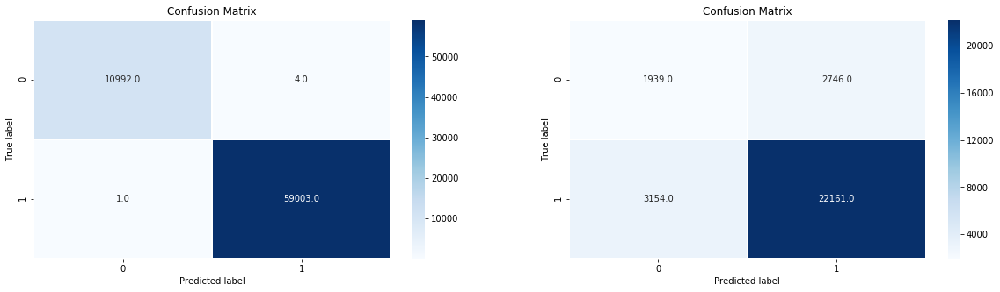

In [44]:
import seaborn as sns
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
cm = confusion_matrix(y_train,pred_train)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test,pred_w2vtfidf)
df = pd.DataFrame(data=cm)
g = sns.heatmap(df, annot=True, fmt=".1f", linewidths=.5,cmap="Blues")
g.set_title('Confusion Matrix')
g.set_ylabel('True label')
g.set_xlabel('Predicted label')

#### Visualization of Decision Tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.13813 to fit



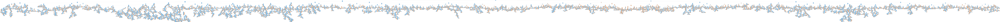

In [23]:
from IPython.display import Image 
from sklearn.tree import export_graphviz
#from graphviz import Source
import graphviz
import pydotplus
target = ['negative','positive']
# Create DOT data
data = tree.export_graphviz(clf,out_file=None,class_names=target,filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(data)

# Show graph
Image(graph.create_png())



Decision Trees are very large to visualize,so let us consider max_depth as 3 to visualize decision trees clearly

#### BOW

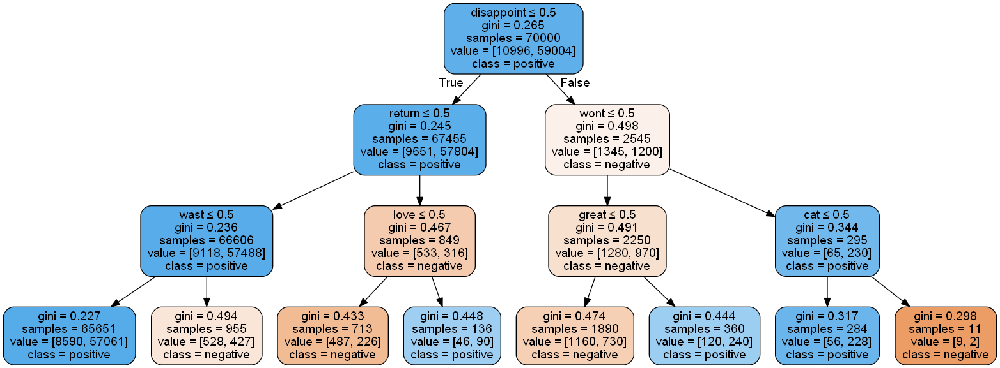

In [33]:
from IPython.display import Image 
from sklearn.tree import export_graphviz
#from graphviz import Source
import graphviz
import pydotplus
from sklearn.externals.six import StringIO  
target = ['negative','positive']
clf =tree.DecisionTreeClassifier(max_depth=3)
clf.fit(X_trainbow, y_train)

dot_data = StringIO()
data = tree.export_graphviz(clf,out_file=dot_data,feature_names=count_vec.get_feature_names(),class_names=target,
                             filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [34]:
graph.write_png("dtreebow.png")

True

#### TF-IDF

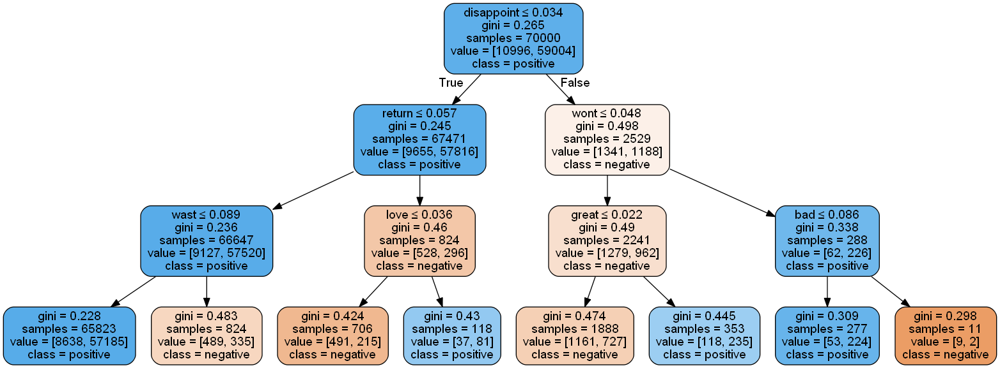

In [35]:
clf =tree.DecisionTreeClassifier(max_depth=3)
clf.fit(X_traintfidf, y_train)

dot_data = StringIO()
data = tree.export_graphviz(clf,out_file=dot_data,feature_names=tfidf.get_feature_names(),class_names=target,
                             filled=True,rounded=True,special_characters=True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [36]:
graph.write_png("dtreetfidf.png")

True

#### AVG W2V

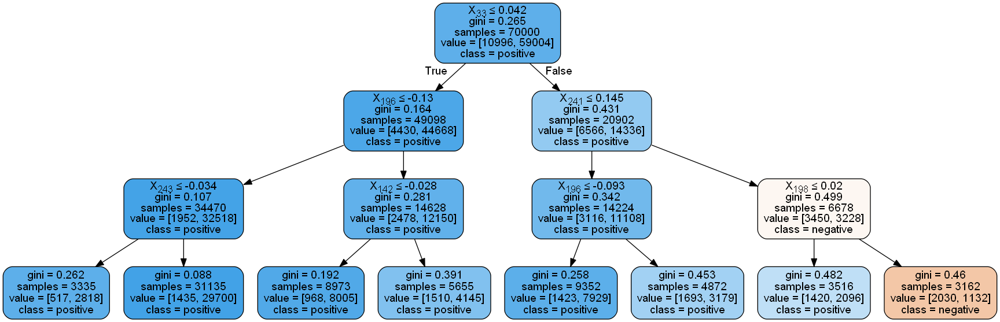

In [37]:
clf =tree.DecisionTreeClassifier(max_depth=3)
clf.fit(X_trainw2v, y_train)

data = tree.export_graphviz(clf,out_file=None,class_names=target,filled=True,rounded=True,special_characters=True)

graph = pydotplus.graph_from_dot_data(data)
graph
Image(graph.create_png())

In [38]:
graph.write_png("dtreew2v.png")

True

#### W2V TF-IDF

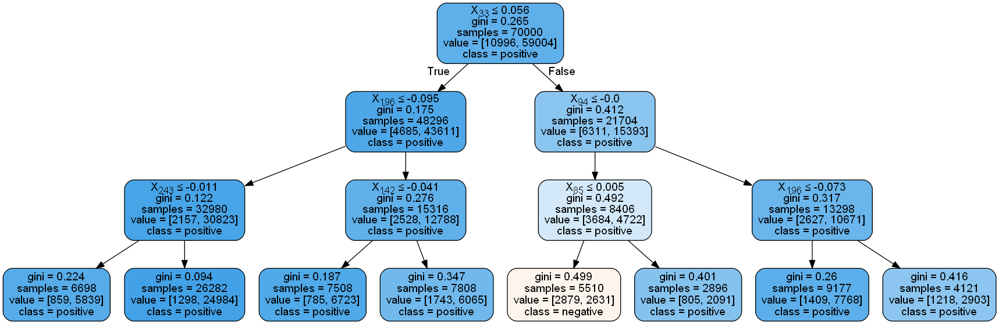

In [39]:
clf =tree.DecisionTreeClassifier(max_depth=3)
clf.fit(X_trainw2vtfidf, y_train)

data = tree.export_graphviz(clf,out_file=None,class_names=target,filled=True,rounded=True,special_characters=True)

graph = pydotplus.graph_from_dot_data(data)
graph
Image(graph.create_png())

In [40]:
graph.write_png("dtreew2vtfidf.png")

True

## Conclusion
1)Decision tree does not perform well with text vectors,as you can see the accuracy in the performance table.
2)As you increase the range of max_depth, it will overfit and will become prone to outliers, so thats why we have taken range from 3 to 11.

## Performance Table

In [41]:
x = PrettyTable()

x.field_names = ["Featurization", "CV","Max_depth","Accuracy","F1 Score"]

x.add_row(["BOW","GridSearch",6,85.75,0.82])
x.add_row(["TFIDF","GridSearch",5,85.77,0.82])
x.add_row(["AVG W2V","GridSearch",42,82.05,0.82])
x.add_row(["TFIDF W2V","GridSearch",35,80.27,0.81])

print(x)


+---------------+------------+-----------+----------+----------+
| Featurization |     CV     | Max_depth | Accuracy | F1 Score |
+---------------+------------+-----------+----------+----------+
|      BOW      | GridSearch |     6     |  85.75   |   0.82   |
|     TFIDF     | GridSearch |     5     |  85.77   |   0.82   |
|    AVG W2V    | GridSearch |     42    |  82.05   |   0.82   |
|   TFIDF W2V   | GridSearch |     35    |  80.27   |   0.81   |
+---------------+------------+-----------+----------+----------+
